This notebook reads in disp rate maps and compares full res and filtered methods (and reference point as average of each igram and ref point as average in a small stable box)

This notebook: <br>
1. Reads in unfiltered, unwrapped disp rate maps 
2. Reads in filtered, unwrapped disp rate maps
3. Compares the two, plot one minus the other.

This notebook was written on 12-19-22

***

In [1]:
# import stuff
import os,sys
import glob
import pandas
from osgeo import gdal
import datetime 
from datetime import datetime
from datetime import timedelta
from dateutil import parser
import numpy as np
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib  widget

Define the time intervals that were separated for each disp rate map.

In [2]:
# igramsDir is where the cropped, unwrapped igrams are 
igramsDir = '/data/ocp4/LagunaSalada/cropped_9000_1800_18000_3600/cropped_northern_shore_LS_for_unwrapping/'
# this one is to pick out the dates 
datesDir = '/data/ocp4/LagunaSalada/cropped_9000_1800_18000_3600/'
# shape of unwrapped igrams
dx = 3000
dy = 750
# load in dates, make sure they are in order
dates = [os.path.basename(x) for x in glob.glob(datesDir+"SLC_vh/2*")]; dates = sorted(dates)
nd = len(dates); numIgrams = nd-1

start_indices = [0,47,108,147,0,0]
end_indices = [46,107,146,numIgrams,88,numIgrams]
num_intervals = len(start_indices)

Read in filtered disp rate map files.

In [3]:
# read in filtered disp rate files 
saveDir = '/data/ocp4/LagunaSalada/11_unwrapped_igrams/disp_rate_maps_for_intervals/'
disp_rates_filt = np.ndarray((num_intervals,dy,dx),dtype='float') 
disp_rates_filt_2 = np.ndarray((num_intervals,dy,dx),dtype='float') 
for i in range(num_intervals):
    file_name = 'interval_'+str(i)+'_filt_ref_to_avg.r4'
    f1 = gdal.Open(saveDir+file_name, gdal.GA_ReadOnly)
    disp_rates_filt[i] = f1.ReadAsArray()
    file_name = 'interval_'+str(i)+'_filt_ref_to_box.r4'
    f1 = gdal.Open(saveDir+file_name, gdal.GA_ReadOnly)
    disp_rates_filt_2[i] = f1.ReadAsArray()
f1 = None
print('Files of filtered disp rate maps loaded.')

Files of filtered disp rate maps loaded.


Read in unfiltered disp rate map files.

In [4]:
# read in full res disp rate files
saveDir = '/data/ocp4/LagunaSalada/11_unwrapped_igrams/disp_rate_maps_for_intervals/'
disp_rates = np.ndarray((num_intervals,dy,dx),dtype='float') 
disp_rates_2 = np.ndarray((num_intervals,dy,dx),dtype='float') 
for i in range(num_intervals): 
    file_name = 'interval_'+str(i)+'_ref_to_avg.r4'
    f1 = gdal.Open(saveDir+file_name, gdal.GA_ReadOnly)
    disp_rates[i] = f1.ReadAsArray()
    file_name = 'interval_'+str(i)+'_ref_to_box.r4'
    f1 = gdal.Open(saveDir+file_name, gdal.GA_ReadOnly)
    disp_rates_2[i] = f1.ReadAsArray()
f1 = None
print('Files of disp rate maps loaded.')

Files of disp rate maps loaded.


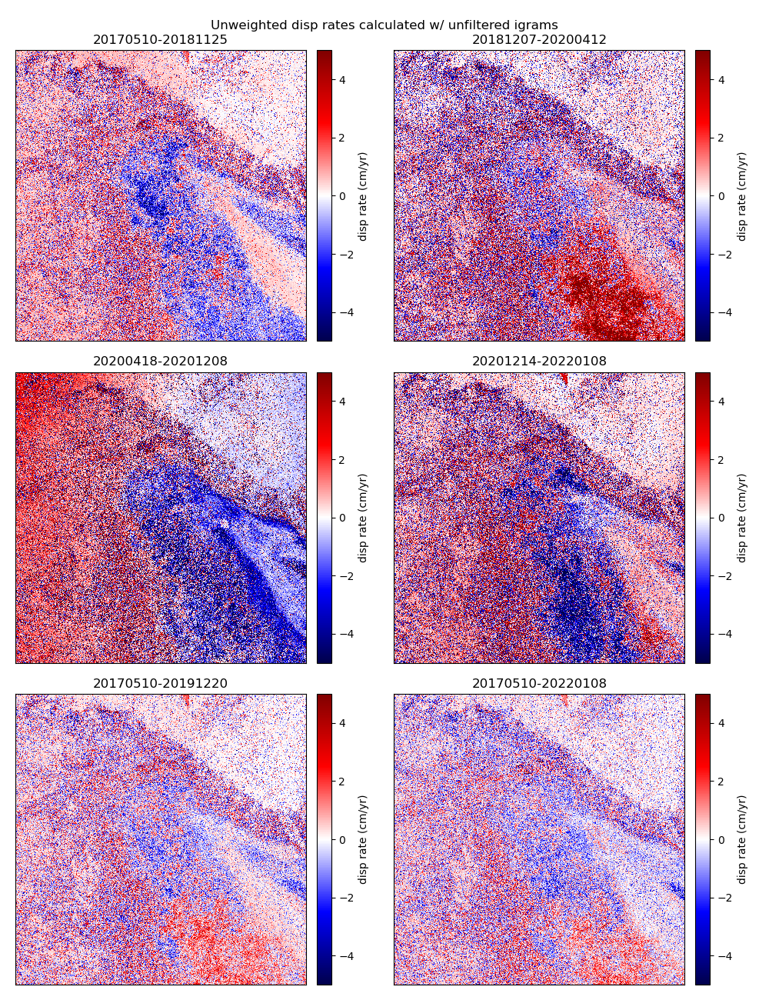

In [5]:
plt.figure(figsize=(10,13),tight_layout=True)
for i in range(num_intervals): 
    plt.subplot(3,2,i+1)
    plt.imshow(disp_rates_2[i], aspect='auto', vmin=-5,vmax=5, \
                    interpolation='nearest', extent = [0,dx,dy,0])
    plt.colorbar(orientation='vertical',pad=0.03,label='disp rate (cm/yr)')
    plt.set_cmap('seismic')
    plt.xlim([dx,0]); plt.ylim([dy,0])
    title = str(str(dates[start_indices[i]])+'-'+str(dates[end_indices[i]]))
    plt.title(title,fontsize=12)
    plt.xticks([]); plt.yticks([])
plt.suptitle('Unweighted disp rates calculated w/ unfiltered igrams')
plt.show()
#plt.savefig("disp_rates_period_1-2.png", transparent=True)

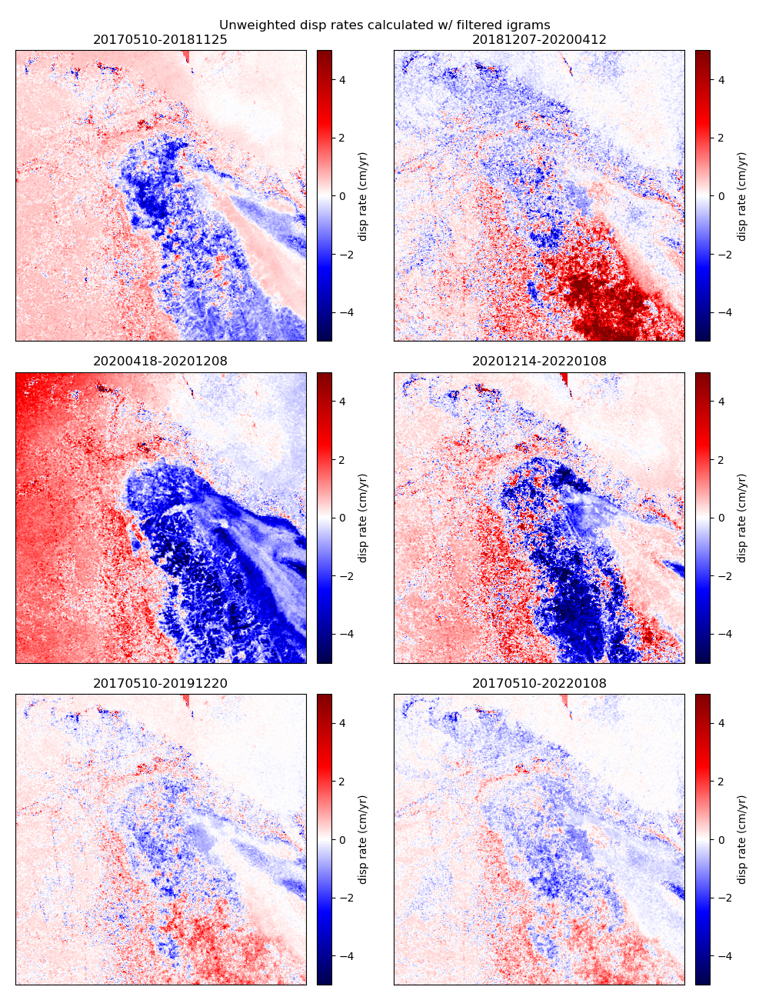

In [10]:
plt.figure(figsize=(10,13),tight_layout=True)
for i in range(num_intervals): 
    plt.subplot(3,2,i+1)
    plt.imshow(disp_rates_filt_2[i], aspect='auto', vmin=-5, vmax=5, \
                    interpolation='nearest', extent = [0,dx,dy,0])
    plt.colorbar(orientation='vertical',pad=0.03,label='disp rate (cm/yr)')
    plt.set_cmap('seismic')
    plt.xlim([dx,0]); plt.ylim([dy,0])
    title = str(str(dates[start_indices[i]])+'-'+str(dates[end_indices[i]]))
    plt.title(title,fontsize=12)
    plt.xticks([]); plt.yticks([])
plt.suptitle('Unweighted disp rates calculated w/ filtered igrams')
plt.show()
#plt.savefig("disp_rates_period_1-2.png", transparent=True)

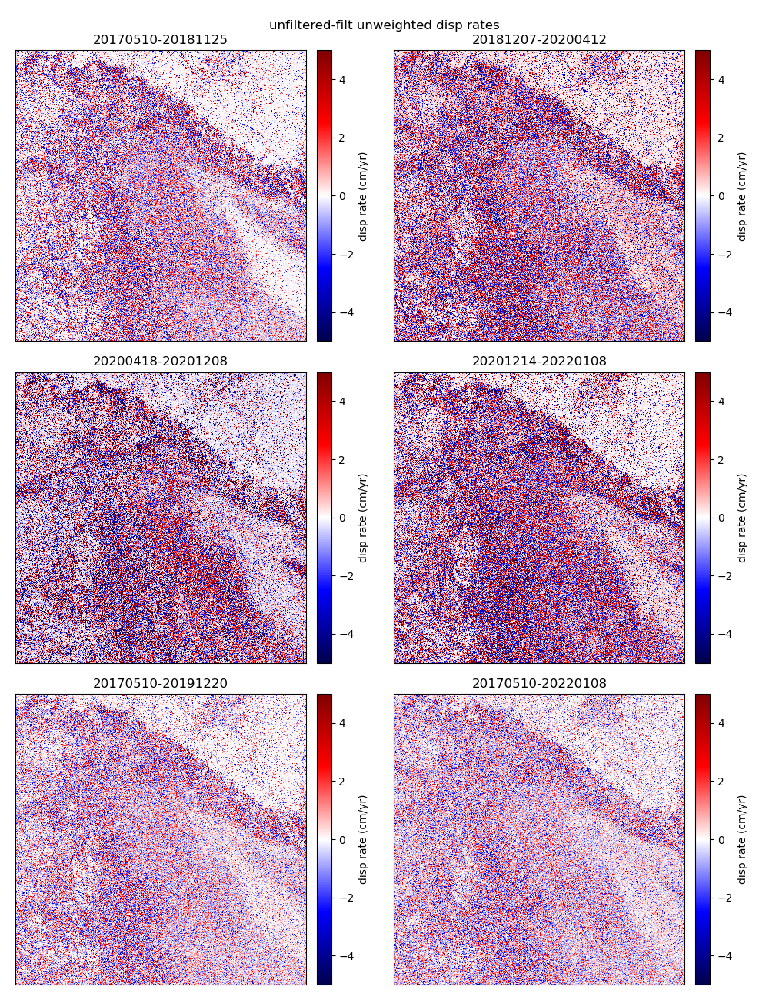

In [12]:
plt.figure(figsize=(10,13),tight_layout=True)
for i in range(num_intervals): 
    plt.subplot(3,2,i+1)
    plt.imshow(disp_rates_2[i]-disp_rates_filt_2[i], aspect='auto', vmin=-5, vmax=5, \
                    interpolation='nearest', extent = [0,dx,dy,0])
    plt.colorbar(orientation='vertical',pad=0.03,label='disp rate (cm/yr)')
    plt.set_cmap('seismic')
    plt.xlim([dx,0]); plt.ylim([dy,0])
    title = str(str(dates[start_indices[i]])+'-'+str(dates[end_indices[i]]))
    plt.title(title,fontsize=12)
    plt.xticks([]); plt.yticks([])
plt.suptitle('unfiltered-filt unweighted disp rates')
plt.show()
#plt.savefig("disp_rates_period_1-2.png", transparent=True)

In [6]:
print(disp_rates_filt[0,0,0])
print(disp_rates_filt_2[0,0,0])
print(disp_rates[0,0,0])
print(disp_rates_2[0,0,0])

-0.018584489822387695
0.01798948086798191
-0.06203538179397583
-0.009047160856425762


In [7]:
colors_to_use = ['gold','hotpink','olive','coral','cornflowerblue','gray']

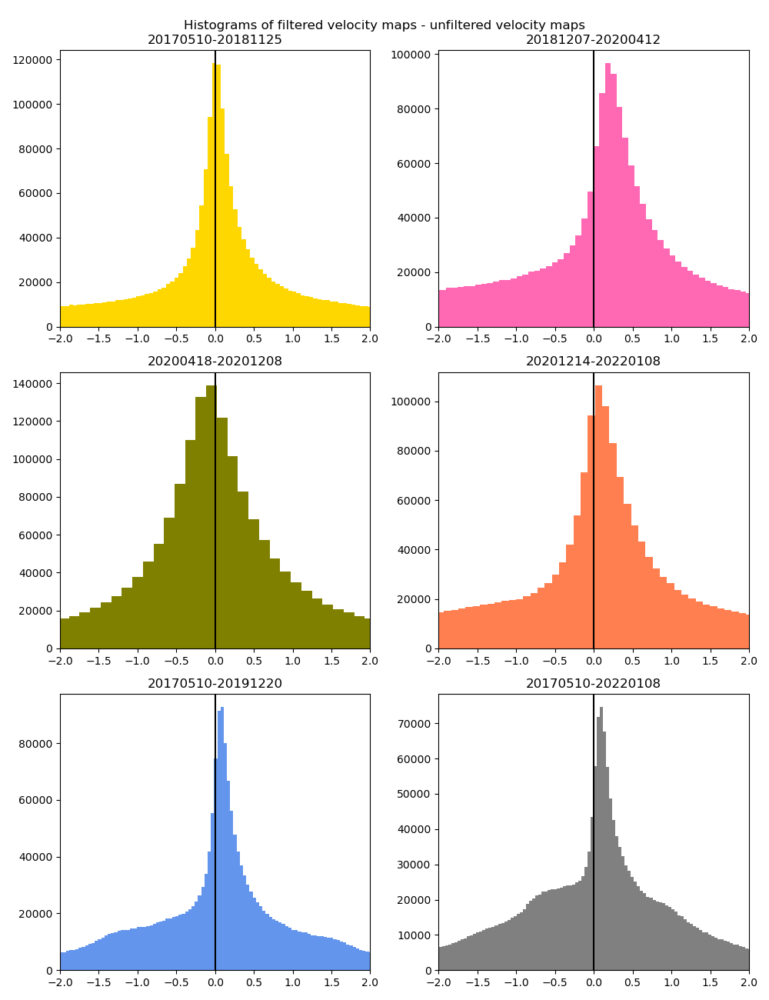

In [9]:
skews = np.zeros((num_intervals))
plt.figure(figsize=(10,13),tight_layout=True)
for i in range(num_intervals): 
    plt.subplot(3,2,i+1)
    temp_hist = (disp_rates_2[i]-disp_rates_filt_2[i]).flatten()
    plt.hist(temp_hist,bins=500,color=colors_to_use[i])
    title = str(str(dates[start_indices[i]])+'-'+str(dates[end_indices[i]]))
    plt.title(title,fontsize=12)
    plt.xlim([-2,2])
    Ymin,Ymax = plt.gca().get_ylim()
    plt.axvline(x=0,ymin=Ymin,ymax=Ymax,color='k')
plt.suptitle('Histograms of filtered velocity maps - unfiltered velocity maps')
plt.show()
#plt.savefig("disp_rates_period_1-2.png", transparent=True)